In [1]:
import pandas as pd
import plotly
from pathlib import Path
import plotly.express as px
import plotly.graph_objects as go
from tqdm.auto import tqdm

from sklearn.metrics import f1_score
from sklearn.model_selection import KFold
from lightgbm import LGBMClassifier

In [2]:
df = pd.read_csv(Path('../data/train.csv'))

In [3]:
df.head(5)

,id,time,x,y
0,1,0,800,0
1,1,780,780,0
2,1,1572,792,0
3,1,2392,820,0
4,1,3196,804,0


In [4]:
df = df.sort_values(['id', 'time'])

In [5]:
prev_id = 0
prev_y = 0
num_observ = 0
markers = []
for i,r in tqdm(df.iterrows(), total=df.shape[0]):
    if prev_id < r['id']:
        if r['y'] == 1:
            num_observ += 1
            markers.append(num_observ)
        else:
            markers.append(0)
    else:
        if r['y'] == 1:
            if prev_y == 1:
                markers.append(num_observ)
            else:
                num_observ += 1
                markers.append(num_observ)       
        else:
            markers.append(0)
    prev_y = r['y']
    prev_id = r['id']
df['spike'] = markers

  0%|          | 0/60487 [00:00<?, ?it/s]

In [6]:
spikes = df[df.spike > 0].groupby('spike').agg({'x': ['min', 'max', 'mean', 'std'], 'id': 'count'})

In [9]:
spikes.columns = ['x_min', 'x_max', 'x_mean', 'x_std', 'count']

In [13]:
spikes

,x_min,x_max,x_mean,x_std,count
spike,,,,,
1,664,784,715.142857,25.836340,14
2,716,828,773.714286,25.186775,14
3,684,784,718.181818,25.003273,11
4,704,840,779.111111,41.941759,9
5,720,832,777.600000,28.671317,10
...,...,...,...,...,...
787,560,668,610.000000,26.482699,10
788,544,628,587.000000,18.379831,12
789,524,628,576.400000,24.617970,10


In [11]:
spikes['count'].min()

6

In [12]:
spikes['count'].max()

41

<AxesSubplot:>

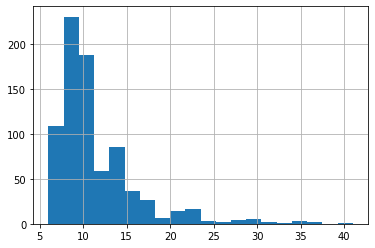

In [10]:
spikes['count'].hist(bins=20)

Мы видим что ширина спайка это 17-18 точек

<AxesSubplot:>

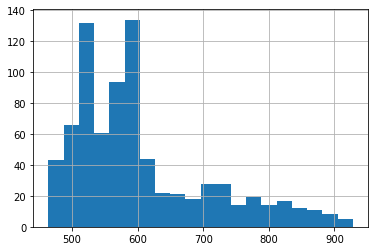

In [39]:
spikes['x_min'].hist(bins=20)

In [87]:
spikes['x_min'].min()

464

<AxesSubplot:>

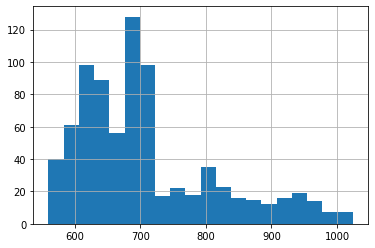

In [40]:
spikes['x_max'].hist(bins=20)

In [88]:
spikes['x_max'].max()

1024

<AxesSubplot:>

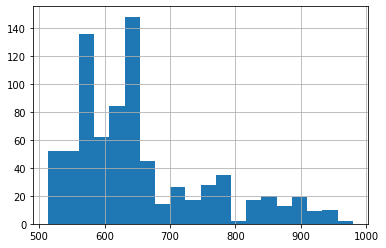

In [41]:
spikes['x_mean'].hist(bins=20)

<AxesSubplot:>

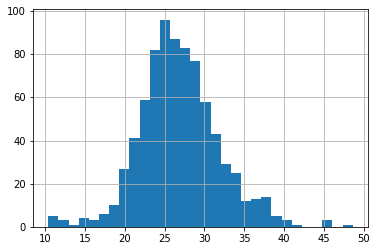

In [43]:
spikes['x_std'].hist(bins=30)

In [14]:
df_spike = df[df.spike > 0].reset_index(drop=True)

In [18]:
spikes.reset_index(inplace=True)

In [19]:
spikes

,spike,x_min,x_max,x_mean,x_std,count
0,1,664,784,715.142857,25.836340,14
1,2,716,828,773.714286,25.186775,14
2,3,684,784,718.181818,25.003273,11
3,4,704,840,779.111111,41.941759,9
4,5,720,832,777.600000,28.671317,10
...,...,...,...,...,...,...
786,787,560,668,610.000000,26.482699,10
787,788,544,628,587.000000,18.379831,12
788,789,524,628,576.400000,24.617970,10
789,790,532,632,581.666667,21.605274,12


In [20]:
df_spike = df_spike.merge(spikes, how='left', on='spike')

In [21]:
df_spike

,id,time,x,y,spike,x_min,x_max,x_mean,x_std,count
0,1,272904,716,1,1,664,784,715.142857,25.836340,14
1,1,273620,716,1,1,664,784,715.142857,25.836340,14
2,1,274340,720,1,1,664,784,715.142857,25.836340,14
3,1,275060,720,1,1,664,784,715.142857,25.836340,14
4,1,275776,716,1,1,664,784,715.142857,25.836340,14
...,...,...,...,...,...,...,...,...,...,...
8956,275,93688,556,1,791,500,608,551.111111,27.333333,9
8957,275,94296,608,1,791,500,608,551.111111,27.333333,9
8958,275,94796,500,1,791,500,608,551.111111,27.333333,9
8959,275,95344,548,1,791,500,608,551.111111,27.333333,9


In [37]:
def is_up(val):
    x, x_mean, x_std = val
    return int(x>x_mean+(x_std))
def is_down(val):
    x, x_mean, x_std = val
    return int(x<x_mean-(x_std))

In [38]:
df_spike['up'] = df_spike[['x', 'x_mean', 'x_std']].apply(is_up, axis=1)

In [39]:
df_spike['down'] = df_spike[['x', 'x_mean', 'x_std']].apply(is_down, axis=1)

In [40]:
count_spikes = df_spike.groupby('spike').agg({'up': 'sum', 'down': 'sum'})

In [41]:
count_spikes[count_spikes.up==0]

,up,down
spike,,


In [69]:
spks = count_spikes[count_spikes.up==1].index
len(spks)

611

In [70]:
spks

Int64Index([  1,   2,   3,   4,   5,   6,   7,   9,  11,  13,
            ...
            779, 780, 781, 783, 784, 787, 788, 789, 790, 791],
           dtype='int64', name='spike', length=611)

In [71]:
for q in spks:
    t = df_spike.loc[df_spike.spike == q].sort_values('time').reset_index(drop=True)
    fig = go.Figure()
    fig.update_layout(title=f"Sample {q}")
#     fig = px.line(t, x='time', y='x', name='R-R')
    
    fig.add_trace(go.Scatter(x=t['time'], y=t['x'],
                        mode='lines',
                        name='Spike'))
    fig.update_traces(line=dict(color="red", width=0.3))
    fig.show()